In [1]:
import pandas as pd
import io
import requests

from datetime import datetime
from pathlib import Path

In [2]:
import warnings
warnings.filterwarnings("ignore")

## OWID COVID-19 Dataset

### Dataset Fetch

In [3]:
owid_online_dataset = "https://covid.ourworldindata.org/data/owid-covid-data.csv"

In [4]:
"""
Try to fetch the most updated version of the CSV online,
if it fails, fallback to the saved filed
"""
        
online_covid_data = requests.get(owid_online_dataset).content
raw_covid_df = pd.read_csv(io.StringIO(online_covid_data.decode('utf-8')))

### Dataset Cleanup

In [5]:
raw_covid_df.tail(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
358749,ZWE,Africa,Zimbabwe,2023-11-20,265890.0,0.0,0.0,5725.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
358750,ZWE,Africa,Zimbabwe,2023-11-21,265890.0,0.0,0.0,5725.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
358751,ZWE,Africa,Zimbabwe,2023-11-22,265890.0,0.0,0.0,5725.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN


In [6]:
"""Inconsistent Data that needs to be purged"""

raw_covid_df[raw_covid_df['continent'].isnull()].head(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
1420,OWID_AFR,NaN,Africa,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1.426737e+09,NaN,NaN,NaN,NaN
1421,OWID_AFR,NaN,Africa,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1.426737e+09,NaN,NaN,NaN,NaN
1422,OWID_AFR,NaN,Africa,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1.426737e+09,NaN,NaN,NaN,NaN
1423,OWID_AFR,NaN,Africa,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1.426737e+09,NaN,NaN,NaN,NaN
1424,OWID_AFR,NaN,Africa,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1.426737e+09,NaN,NaN,NaN,NaN


In [7]:
""" Purging Bad Data """

staging_covid_df = raw_covid_df[raw_covid_df['continent'].notnull()].reset_index()

In [8]:
""" Includes a column that will be used to aggregate all data from the month/year """

to_year_month = lambda str_date: datetime.strptime(str_date, "%Y-%m-%d").replace(day=1)

staging_covid_df['year_month'] = staging_covid_df.apply(lambda row: to_year_month(row['date']), axis=1)

### Fixing Geographic Region for Countries

#### North and Central America

In [9]:
""" 
All countries in Central America, such as 'Cuba', 'Panama', 'Costa Rica', etc
are set with the continent as 'North America', let's fix that
"""

na_marked_countries = staging_covid_df.loc[ 
  (staging_covid_df['continent'] == 'North America')
]

na_marked_countries['location'].unique()

array(['Anguilla', 'Antigua and Barbuda', 'Aruba', 'Bahamas', 'Barbados',
       'Belize', 'Bermuda', 'Bonaire Sint Eustatius and Saba',
       'British Virgin Islands', 'Canada', 'Cayman Islands', 'Costa Rica',
       'Cuba', 'Curacao', 'Dominica', 'Dominican Republic', 'El Salvador',
       'Greenland', 'Grenada', 'Guadeloupe', 'Guatemala', 'Haiti',
       'Honduras', 'Jamaica', 'Martinique', 'Mexico', 'Montserrat',
       'Nicaragua', 'Panama', 'Puerto Rico', 'Saint Barthelemy',
       'Saint Kitts and Nevis', 'Saint Lucia',
       'Saint Martin (French part)', 'Saint Pierre and Miquelon',
       'Saint Vincent and the Grenadines', 'Sint Maarten (Dutch part)',
       'Trinidad and Tobago', 'Turks and Caicos Islands', 'United States',
       'United States Virgin Islands'], dtype=object)

In [10]:
"""
All countries in 'continent' == 'North America that are NOT (~): 
'United States', 'Canada' or 'Mexico' should be set as 'Central America
"""

staging_covid_df.loc[ 
    (staging_covid_df['continent'] == 'North America') & 
    (~staging_covid_df['location'].isin(['United States', 'Canada', 'Mexico'])),
    'continent'
] = "Central America"

In [11]:
"""
All countries in Central America, such as 'Cuba', 'Panama', 'Costa Rica', etc
are set with the continent as 'North America', let's fix that
"""

na_countries = staging_covid_df.loc[ 
  (staging_covid_df['continent'] == 'North America')
]

na_countries['location'].unique()

array(['Canada', 'Mexico', 'United States'], dtype=object)

#### Eastern, Western, Northern, Southern Europe

In [12]:
#TODO

### Fixing Labels

In [13]:
""" Renames 'location' to 'country' """

staging_covid_df = staging_covid_df.rename(columns={
    'location': 'country'
})

## Data Aggregation

### Data Aggregation by Country by Period

In [14]:
"""
Sum of number of new_cases and Sum of number of new_deaths 
by aggregating values that havethe same country,and same period (year_month)
"""

covid_by_country_by_period = (
    staging_covid_df
    .groupby(['country', 'iso_code', 'continent', 'year_month'])
    .agg({'new_cases': sum, 'new_deaths': sum})
    .sort_values(by=['year_month', 'country', 'continent'], ascending=[False, True, True])
    .reset_index()
)

In [15]:
covid_by_country_by_period[
  (covid_by_country_by_period['continent'] == 'North America') &
  (covid_by_country_by_period['year_month'] == '2020-03-01')
]

,country,iso_code,continent,year_month,new_cases,new_deaths
10638,Canada,CAN,North America,2020-03-01,6242.0,42.0
10736,Mexico,MEX,North America,2020-03-01,2470.0,52.0
10829,United States,USA,North America,2020-03-01,173074.0,3326.0


### Data Aggregation by Continent by Period

In [16]:
"""
Sum of number of new_cases and Sum of number of new_deaths 
by aggregating values that have the same continent (location), and same period (year_month)

It's gonna be used to compute statistics for each continent
(standard_deviation, mean, median, etc)
"""
covid_by_continent_by_period = (
    covid_by_country_by_period
    .groupby(['year_month', 'continent'])
    .agg({'new_cases': sum, 'new_deaths': sum})
)

In [17]:
covid_by_continent_by_period.loc[('2020-03-01', 'North America')]

new_cases     181786.0
new_deaths      3420.0
Name: (2020-03-01 00:00:00, North America), dtype: float64

### Data Aggregation by Period

In [18]:
"""
Sum of number of new_cases and Sum of number of new_deaths 
by aggregating values that have the same period (year_month)

It's gonna be used to compute global/world statistics 
(standard_deviation, mean, median, etc)
"""

covid_by_period_in_world = (
    covid_by_country_by_period
    .groupby(['year_month'], as_index=['year_month'])
    .agg({'new_cases': sum, 'new_deaths': sum})
)

In [19]:
covid_by_period_in_world.tail(5)

,new_cases,new_deaths
year_month,,
2023-07-01,1412265.0,4717.0
2023-08-01,1542196.0,3331.0
2023-09-01,670016.0,3885.0
2023-10-01,695317.0,6136.0
2023-11-01,307141.0,1447.0


## Generating Statistics

### Base Statistics

In [20]:
"""
Generating statistics per Period (Year-Month) per Continent:
- count => number of countries reporting
- mean => aritmetic average 
- std => standard deviation

Note: Always consider the YEAR-MONTH for the 'year_month' field. 
      The DAY will always be '01'
"""
stats_by_period_by_continent = (
    covid_by_country_by_period
    .groupby(['year_month', 'continent'])
    .describe()
)

stats_by_period_by_continent.tail(12)

new_cases                                         \
                               count         mean           std  min    25%   
year_month continent                                                          
2023-10-01 Central America      38.0    12.421053     38.521760  0.0    0.0   
           Europe               54.0  9699.462963  26047.613853  0.0    0.0   
           North America         3.0   418.000000    389.958972  0.0  241.0   
           Oceania              24.0  2069.416667   6706.848829  0.0    0.0   
           South America        14.0   320.357143    497.933361  0.0    0.0   
2023-11-01 Africa               57.0     6.736842     39.983714  0.0    0.0   
           Asia                 47.0   947.723404   4652.799992  0.0    0.0   
           Central America      38.0     0.342105      1.648526  0.0    0.0   
           Europe               53.0  4360.018868  14339.976149  0.0    0.0   
           North America         3.0    26.666667     46.188022  0.0    0.0   
           Oceania              24.0  1257.708333   4548.155608  0.0    0.0   
           South America        14.0    61.071429    110.941055  0.0    0.0   

                                                     new_deaths             \
                              50%      75%       max      count       mean   
year_month continent                                                         
2023-10-01 Central America    0.0     1.75     205.0       38.0   0.157895   
           Europe           333.0  6710.25  151111.0       54.0  73.574074   
           North America    482.0   627.00     772.0        3.0  30.000000   
           Oceania            1.0    28.50   29620.0       24.0  15.458333   
           South America     55.0   448.75    1621.0       14.0   4.000000   
2023-11-01 Africa             0.0     0.00     300.0       57.0   0.017544   
           Asia               0.0    78.50   31836.0       47.0   4.148936   
           Central America    0.0     0.00      10.0       38.0   0.000000   
           Europe             0.0  1027.00   75577.0       53.0  21.075472   
           North America      0.0    40.00      80.0        3.0   2.666667   
           Oceania            0.0     5.75   20622.0       24.0   5.166667   
           South America      0.0    86.75     311.0       14.0   0.142857   

                                                                      
                                   std  min  25%  50%    75%     max  
year_month continent                                                  
2023-10-01 Central America    0.822860  0.0  0.0  0.0   0.00     5.0  
           Europe           194.810658  0.0  0.0  0.0  31.75  1136.0  
           North America     51.097945  0.0  0.5  1.0  45.00    89.0  
           Oceania           58.180364  0.0  0.0  0.0   0.00   272.0  
           South America      6.770979  0.0  0.0  0.0   6.75    21.0  
2023-11-01 Africa             0.132453  0.0  0.0  0.0   0.00     1.0  
           Asia              16.816114  0.0  0.0  0.0   0.00   108.0  
           Central America    0.000000  0.0  0.0  0.0   0.00     0.0  
           Europe            66.991058  0.0  0.0  0.0   2.00   405.0  
           North America      4.618802  0.0  0.0  0.0   4.00     8.0  
           Oceania           17.566437  0.0  0.0  0.0   0.00    67.0  
           South America      0.363137  0.0  0.0  0.0   0.00     1.0

In [21]:
"""
Generating GLOBAL statistics per Period (Year-Month):
- count => number of countries reporting  (numero de paises reportanto)
- mean => aritmetic average (média aritmetica)
- std => standard deviation (desvio padrao)

Note: Always consider the YEAR-MONTH for the 'year_month' field. 
      The DAY will always be '01'
"""

stats_by_period_in_world = (
    covid_by_country_by_period
    .groupby(['year_month'])
    .describe()
)

stats_by_period_in_world.tail(6)

new_cases                                                     \
               count         mean           std  min  25%   50%     75%   
year_month                                                                
2023-06-01     240.0  4321.320833  29066.988035  0.0  0.0  16.0  620.25   
2023-07-01     240.0  5884.437500  69219.004104  0.0  0.0   3.5  286.50   
2023-08-01     239.0  6452.702929  79940.982369  0.0  0.0   4.0  203.50   
2023-09-01     238.0  2815.193277  14058.157354  0.0  0.0   1.5  195.75   
2023-10-01     237.0  2933.827004  14054.427186  0.0  0.0   2.0  160.00   
2023-11-01     236.0  1301.444915   7395.484536  0.0  0.0   0.0    2.50   

                      new_deaths                                             \
                  max      count       mean         std  min  25%  50%  75%   
year_month                                                                    
2023-06-01   428095.0      240.0  30.833333  111.032946  0.0  0.0  0.0  5.0   
2023-07-01  1070190.0      240.0  19.654167   80.658801  0.0  0.0  0.0  2.0   
2023-08-01  1234746.0      239.0  13.937238   65.703180  0.0  0.0  0.0  0.0   
2023-09-01   140192.0      238.0  16.323529   87.963506  0.0  0.0  0.0  0.0   
2023-10-01   151111.0      237.0  25.890295  128.113052  0.0  0.0  0.0  0.0   
2023-11-01    75577.0      236.0   6.131356   33.874419  0.0  0.0  0.0  0.0   

                    
               max  
year_month          
2023-06-01  1055.0  
2023-07-01   940.0  
2023-08-01   779.0  
2023-09-01  1188.0  
2023-10-01  1262.0  
2023-11-01   405.0

### New Cases - Statistics per Period per Continent

In [22]:
stats_cases_by_period_by_continent = (
    stats_by_period_by_continent
    .new_cases
    .join(covid_by_continent_by_period)
    .drop(['count', 'new_deaths'], axis=1)
)

stats_cases_by_period_by_continent

mean           std  min  25%  50%      75%  \
year_month continent                                                            
2020-01-01 Africa              0.000000      0.000000  0.0  0.0  0.0     0.00   
           Asia              200.469388   1388.275791  0.0  0.0  0.0     1.00   
           Central America     0.000000      0.000000  0.0  0.0  0.0     0.00   
           Europe              0.274510      0.801958  0.0  0.0  0.0     0.00   
           North America       3.666667      4.041452  0.0  1.5  3.0     5.50   
...                                 ...           ...  ...  ...  ...      ...   
2023-11-01 Central America     0.342105      1.648526  0.0  0.0  0.0     0.00   
           Europe           4360.018868  14339.976149  0.0  0.0  0.0  1027.00   
           North America      26.666667     46.188022  0.0  0.0  0.0    40.00   
           Oceania          1257.708333   4548.155608  0.0  0.0  0.0     5.75   
           South America      61.071429    110.941055  0.0  0.0  0.0    86.75   

                                max  new_cases  
year_month continent                            
2020-01-01 Africa               0.0        0.0  
           Asia              9720.0     9823.0  
           Central America      0.0        0.0  
           Europe               3.0       14.0  
           North America        8.0       11.0  
...                             ...        ...  
2023-11-01 Central America     10.0       13.0  
           Europe           75577.0   231081.0  
           North America       80.0       80.0  
           Oceania          20622.0    30185.0  
           South America      311.0      855.0  

[329 rows x 8 columns]

### New Cases - Statistics per Period in the WORLD

In [23]:
stats_cases_by_period_in_world = (
    stats_by_period_in_world
    .new_cases
    .join(covid_by_period_in_world)
    .drop(['count', 'new_deaths'], axis=1)
)

stats_cases_by_period_in_world

,mean,std,min,25%,50%,75%,max,new_cases
year_month,,,,,,,,
2020-01-01,41.766949,6.326862e+02,0.0,0.00,0.0,0.00,9720.0,9857.0
2020-02-01,316.500000,4.538094e+03,0.0,0.00,0.0,0.00,69669.0,74694.0
2020-03-01,2919.301255,1.557590e+04,0.0,5.00,55.0,523.50,173074.0,697713.0
2020-04-01,9262.070833,5.801278e+04,0.0,13.00,204.0,1611.75,857163.0,2222897.0
2020-05-01,12043.245833,6.010191e+04,0.0,3.00,243.5,2683.50,755116.0,2890379.0
2020-06-01,17785.008333,8.513688e+04,0.0,5.75,407.5,4058.25,878977.0,4268402.0
2020-07-01,29058.225000,1.622383e+05,0.0,12.75,430.0,7395.00,1884228.0,6973974.0
2020-08-01,34533.008333,1.843659e+05,0.0,33.50,1009.0,8071.50,1982375.0,8287922.0
2020-09-01,35976.075000,1.973113e+05,0.0,30.75,1107.5,9248.50,2604518.0,8634258.0


### New Victims - Statistics per Period per Continent

In [24]:
stats_victims_by_period_by_continent = (
    stats_by_period_by_continent
    .new_deaths
    .join(covid_by_continent_by_period)
    .drop(['count', 'new_cases'], axis=1)
)

stats_victims_by_period_by_continent

mean        std  min  25%  50%  75%    max  \
year_month continent                                                          
2020-01-01 Africa            0.000000   0.000000  0.0  0.0  0.0  0.0    0.0   
           Asia              4.346939  30.428571  0.0  0.0  0.0  0.0  213.0   
           Central America   0.000000   0.000000  0.0  0.0  0.0  0.0    0.0   
           Europe            0.117647   0.840168  0.0  0.0  0.0  0.0    6.0   
           North America     0.000000   0.000000  0.0  0.0  0.0  0.0    0.0   
...                               ...        ...  ...  ...  ...  ...    ...   
2023-11-01 Central America   0.000000   0.000000  0.0  0.0  0.0  0.0    0.0   
           Europe           21.075472  66.991058  0.0  0.0  0.0  2.0  405.0   
           North America     2.666667   4.618802  0.0  0.0  0.0  4.0    8.0   
           Oceania           5.166667  17.566437  0.0  0.0  0.0  0.0   67.0   
           South America     0.142857   0.363137  0.0  0.0  0.0  0.0    1.0   

                            new_deaths  
year_month continent                    
2020-01-01 Africa                  0.0  
           Asia                  213.0  
           Central America         0.0  
           Europe                  6.0  
           North America           0.0  
...                                ...  
2023-11-01 Central America         0.0  
           Europe               1117.0  
           North America           8.0  
           Oceania               124.0  
           South America           2.0  

[329 rows x 8 columns]

### New Victims - Statistics per Period in the WORLD

In [25]:
stats_victims_by_period_in_world = (
    stats_by_period_in_world
    .new_deaths
    .join(covid_by_period_in_world)
    .drop(['count', 'new_cases'], axis=1)
)

stats_victims_by_period_in_world

,mean,std,min,25%,50%,75%,max,new_deaths
year_month,,,,,,,,
2020-01-01,0.927966,13.868957,0.0,0.00,0.0,0.00,213.0,219.0
2020-02-01,11.487288,170.872467,0.0,0.00,0.0,0.00,2625.0,2711.0
2020-03-01,170.129707,1017.553440,0.0,0.00,1.0,10.00,11570.0,40661.0
2020-04-01,806.466667,4622.557900,0.0,0.00,6.0,61.50,57134.0,193552.0
2020-05-01,684.825000,3692.063299,0.0,0.00,4.0,69.00,44864.0,164358.0
2020-06-01,640.308333,3098.727070,0.0,0.00,3.0,76.25,29744.0,153674.0
2020-07-01,768.491667,3656.315200,0.0,0.00,5.0,115.75,32512.0,184438.0
2020-08-01,807.720833,3863.998856,0.0,0.00,9.0,135.25,31831.0,193853.0
2020-09-01,701.279167,3180.598664,0.0,0.00,10.5,139.75,33028.0,168307.0


### Merging Country, Continent and World Statistics

#### Merging Country New Cases with Continent and World Statistics

In [26]:
"""
Matches each (period, country) with their respective (period, continent),
and adds the continent statistics (standard deviation, mean, percentile, etc) 

And then also matches with the respective (period) from the global/world
statistics as well
"""

cases_df = (
    covid_by_country_by_period
    .set_index(['year_month', 'continent'])
    .merge(stats_cases_by_period_by_continent, left_index=True, right_index=True)
    .rename(columns={
        'new_cases_x': 'new_cases',
        'mean': 'cont_mean',
        'std':  'cont_std_deviation',
        'min':  'cont_min',
        'max':  'cont_max',
        '25%':  'cont_p25%',
        '50%':  'cont_p50%',
        '75%':  'cont_p75%'
    })
    .merge(stats_cases_by_period_in_world, left_index=True, right_index=True)
    .rename(columns={
        'new_cases_x': 'new_cases',
        'mean': 'world_mean',
        'std': 'world_std_deviation',
        'min': 'world_min',
        'max': 'world_max',
        '25%': 'world_p25%',
        '50%': 'world_p50%',
        '75%': 'world_p75%'
    })
    .drop(['new_deaths', 'new_cases_y'], axis=1)\
    .reset_index()
    .set_index(['year_month','country'])
)

In [27]:
"""
This cell is merely for data visualization, 

you can add new `countries` or new `periods` (in the format of YYYY-MM) 
in the lists below to add to the dataframe visualization
"""

countries = ['United States']
periods = ['2020-01', '2020-02', '2020-03']

_ = cases_df.reset_index()
_[
  (_['country' ].isin(countries)) & 
  (_['year_month'].isin(periods)) 
]

,year_month,country,continent,iso_code,new_cases,cont_mean,cont_std_deviation,cont_min,cont_p25%,cont_p50%,cont_p75%,cont_max,world_mean,world_std_deviation,world_min,world_p25%,world_p50%,world_p75%,world_max
197,2020-01-01,United States,North America,USA,8.0,3.666667,4.041452,0.0,1.5,3.0,5.5,8.0,41.766949,632.686162,0.0,0.0,0.0,0.0,9720.0
433,2020-02-01,United States,North America,USA,61.0,26.333333,30.435725,4.0,9.0,14.0,37.5,61.0,316.500000,4538.094239,0.0,0.0,0.0,0.0,69669.0
672,2020-03-01,United States,North America,USA,173074.0,60595.333333,97427.638981,2470.0,4356.0,6242.0,89658.0,173074.0,2919.301255,15575.899570,0.0,5.0,55.0,523.5,173074.0


#### Merging Country New Victims with Continent and World Statistics

In [28]:
victims_df = (
    covid_by_country_by_period.set_index(['year_month', 'continent'])
    .merge(stats_victims_by_period_by_continent, left_index=True, right_index=True)
    .rename(columns={
        'new_deaths_x': 'new_victims',
        'mean': 'cont_mean',
        'std':  'cont_std_deviation',
        'min':  'cont_min',
        'max':  'cont_max',
        '25%':  'cont_p25%',
        '50%':  'cont_p50%',
        '75%':  'cont_p75%'
    })
    .merge(stats_victims_by_period_in_world, left_index=True, right_index=True)
    .rename(columns={
        'mean': 'world_mean',
        'std': 'world_std_deviation',
        'min': 'world_min',
        'max': 'world_max',
        '25%': 'world_p25%',
        '50%': 'world_p50%',
        '75%': 'world_p75%'
    })
    .drop(['new_cases', 'new_deaths', 'new_deaths_y'], axis=1)\
    .reset_index()
    .set_index(['year_month', 'country'])
)

In [29]:
"""
This cell is merely for data visualization, 

you can add new `countries` or new `periods` (in the format of YYYY-MM) 
in the lists below to add to the dataframe visualization
"""

countries = ['United States', 'Canada', 'Germany', 'France']
periods = ['2020-03', '2020-04']

_ = victims_df.reset_index()
_[
  (_['country' ].isin(countries)) & 
  (_['year_month'].isin(periods)) 
]

,year_month,country,continent,iso_code,new_victims,cont_mean,cont_std_deviation,cont_min,cont_p25%,cont_p50%,cont_p75%,cont_max,world_mean,world_std_deviation,world_min,world_p25%,world_p50%,world_p75%,world_max
631,2020-03-01,France,Europe,FRA,2712.0,599.444444,2014.481043,0.0,1.0,12.5,72.75,11570.0,170.129707,1017.55344,0.0,0.0,1.0,10.0,11570.0
632,2020-03-01,Germany,Europe,DEU,2035.0,599.444444,2014.481043,0.0,1.0,12.5,72.75,11570.0,170.129707,1017.55344,0.0,0.0,1.0,10.0,11570.0
670,2020-03-01,Canada,North America,CAN,42.0,1140.000000,1893.138135,42.0,47.0,52.0,1689.00,3326.0,170.129707,1017.55344,0.0,0.0,1.0,10.0,11570.0
672,2020-03-01,United States,North America,USA,3326.0,1140.000000,1893.138135,42.0,47.0,52.0,1689.00,3326.0,170.129707,1017.55344,0.0,0.0,1.0,10.0,11570.0
870,2020-04-01,France,Europe,FRA,11446.0,1912.927273,5627.891915,0.0,14.0,61.0,529.00,33748.0,806.466667,4622.55790,0.0,0.0,6.0,61.5,57134.0
871,2020-04-01,Germany,Europe,DEU,6104.0,1912.927273,5627.891915,0.0,14.0,61.0,529.00,33748.0,806.466667,4622.55790,0.0,0.0,6.0,61.5,57134.0
910,2020-04-01,Canada,North America,CAN,2811.0,21287.333333,31049.048976,2811.0,3364.0,3917.0,30525.50,57134.0,806.466667,4622.55790,0.0,0.0,6.0,61.5,57134.0
912,2020-04-01,United States,North America,USA,57134.0,21287.333333,31049.048976,2811.0,3364.0,3917.0,30525.50,57134.0,806.466667,4622.55790,0.0,0.0,6.0,61.5,57134.0


## Plotting Data

In [30]:
import plotly
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

In [31]:
cases_plotting_df = (
    cases_df
    .reset_index()
    .groupby(['country', 'year_month'])
    .agg({'new_cases': sum})
)

cases_countries = sorted(set(cases_plotting_df.index.get_level_values(0)))

In [32]:
victims_plotting_df = (
    victims_df
    .reset_index()
    .groupby(['country', 'year_month'])
    .agg({'new_victims': sum})
)

victims_countries = sorted(set(victims_plotting_df.index.get_level_values(0)))

### New Cases - Lines

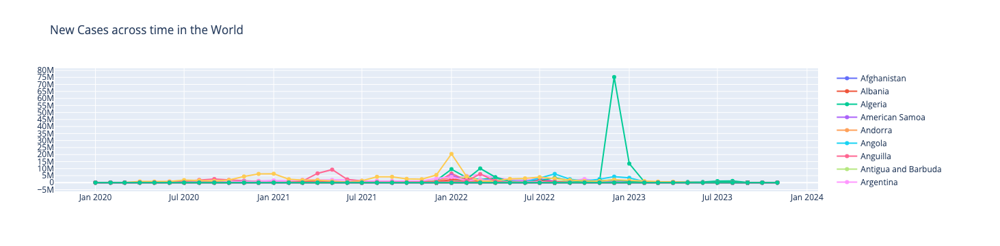

In [33]:
"""
Use the controls on the top right of the chars to zoom in and out, 
or to select a specific part of the graph
"""

fig = go.Figure()

for idx in cases_countries:
    country_data = cases_plotting_df.loc[idx]
    fig.add_trace(go.Scatter(
        x=country_data.index, 
        y=country_data.new_cases,
        mode='lines+markers', 
        name=idx
    ))

fig.update_layout(
    title="New Cases across time in the World", 
    xaxis_nticks=16,
    yaxis_nticks=20
)

fig.show()

### New Cases - Scatter

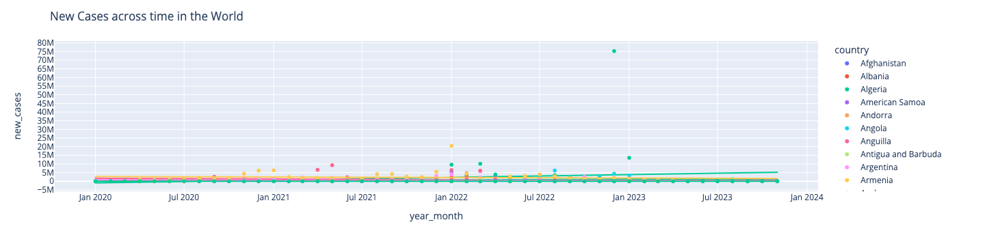

In [34]:
scatter_plot_cases_df = cases_plotting_df.reset_index()

fig = px.scatter(
    scatter_plot_cases_df, 
    x=scatter_plot_cases_df.year_month, 
    y=scatter_plot_cases_df.new_cases, 
    color=scatter_plot_cases_df.country, 
    trendline='ols'
)

fig.update_layout(
    title="New Cases across time in the World",
    xaxis_nticks=16,
    yaxis_nticks=20
)

fig.show()

### New Cases - Histogram (Barmode='Group')

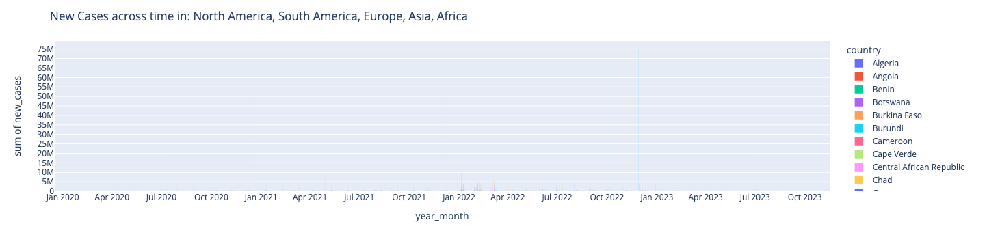

In [35]:
"""
Make sure to use the controls on the top right of the chars to ZOOM IN and OUT
or to select a specific part of the graph

You can also add/remove the continent names from the `continents` variable
to make the visualizations easier
"""

hist_plot_cases_df = cases_df.reset_index()
continents = ['North America', 'South America', 'Europe', 'Asia', 'Africa']

hist_plot_cases_df = hist_plot_cases_df[hist_plot_cases_df['continent'].isin(continents)]

fig = px.histogram(
    hist_plot_cases_df, 
    x=hist_plot_cases_df.year_month, 
    y=hist_plot_cases_df.new_cases, 
    color=hist_plot_cases_df.country
)

fig.update_layout(
    title=f"New Cases across time in: {', '.join(continents)} ",
    xaxis_nticks=16,
    yaxis_nticks=20,
    barmode='group'
)

fig.show()

### New Cases - Heatmap

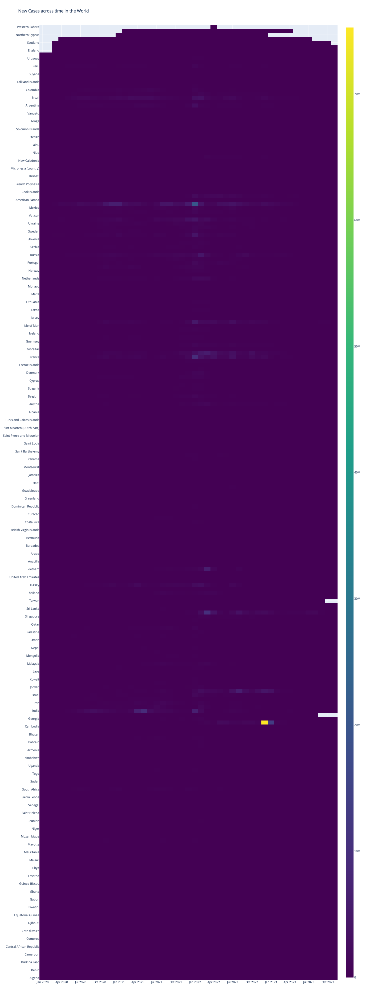

In [36]:
heatmap_plot_cases_df = cases_df.reset_index()

fig = go.Figure(data=go.Heatmap(
    x = heatmap_plot_cases_df.year_month,
    y = heatmap_plot_cases_df.country,
    z = heatmap_plot_cases_df.new_cases,
    colorscale = 'Viridis'
))

fig.update_layout(
    title='New Cases across time in the World',
    xaxis_nticks=16,
    yaxis_nticks=190,
    height=4000
)

fig.show()

### New Victims - Lines

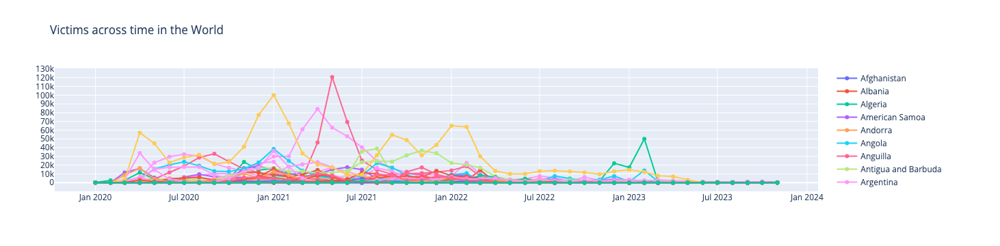

In [37]:
"""
Use the controls on the top right of the chars to zoom in and out, 
or to select a specific part of the graph
"""
fig = go.Figure()

for idx in victims_countries:
    country_data = victims_plotting_df.loc[idx]
    fig.add_trace(go.Scatter(
        x=country_data.index, 
        y=country_data.new_victims,
        mode='lines+markers', 
        name=idx
    ))

fig.update_layout(
    title="Victims across time in the World",
    xaxis_nticks=16,
    yaxis_nticks=20
)

fig.show()

### New Victims - Scatter

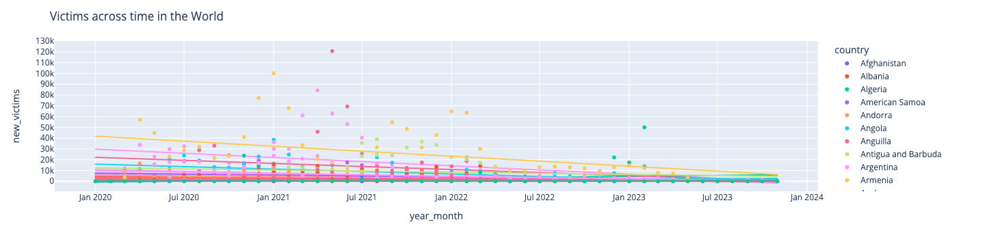

In [38]:
scatter_plot_victims_df = victims_plotting_df.reset_index()

fig = px.scatter(
    scatter_plot_victims_df, 
    x=scatter_plot_victims_df.year_month, 
    y=scatter_plot_victims_df.new_victims, 
    color=scatter_plot_victims_df.country, 
    trendline='ols'
)

fig.update_layout(
    title="Victims across time in the World",
    xaxis_nticks=16,
    yaxis_nticks=20
)

fig.show()

### New Victims - Histogram (Barmode='Group')

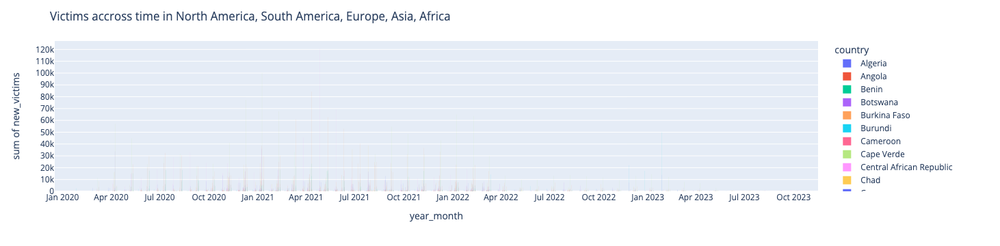

In [39]:
"""
Make sure to use the controls on the top right of the chars to ZOOM IN and OUT
or to select a specific part of the graph

You can also add/remove the continent names from the `continents` variable
to make the visualizations easier
"""

hist_plot_victims_df = victims_df.reset_index()
continents = ['North America', 'South America', 'Europe', 'Asia', 'Africa']

hist_victim_data = hist_plot_victims_df[hist_plot_victims_df['continent'].isin(continents)]

fig = px.histogram(
    hist_plot_victims_df, 
    x=hist_plot_victims_df.year_month, 
    y=hist_plot_victims_df.new_victims, 
    color=hist_plot_victims_df.country
)

fig.update_layout(
    title=f"Victims accross time in {', '.join(continents)} ",
    xaxis_nticks=16,
    yaxis_nticks=20,
    barmode='group'
)

fig.show()

### New Victims - Heatmap

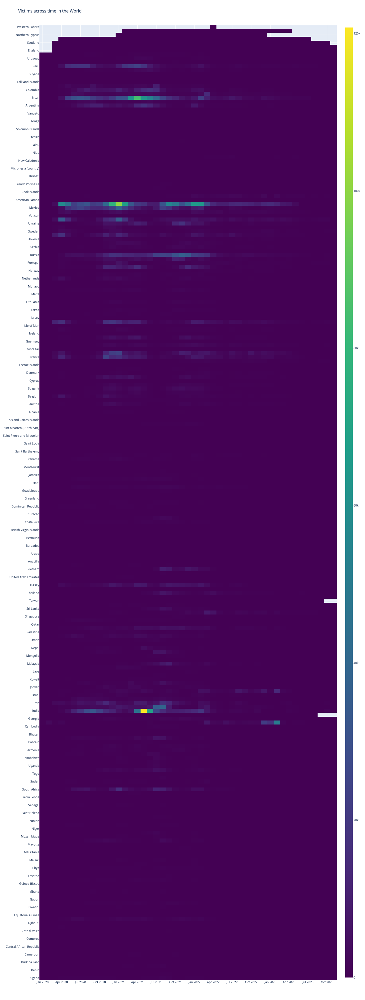

In [40]:
heatmap_plot_victims_df = victims_df.reset_index()

fig = go.Figure(data=go.Heatmap(
    x = heatmap_plot_victims_df.year_month,
    y = heatmap_plot_victims_df.country,
    z = heatmap_plot_victims_df.new_victims,
    colorscale = 'Viridis'    
))

fig.update_layout(
    title='Victims across time in the World',
    xaxis_nticks=16,
    yaxis_nticks=190,
    height=4000
)

fig.show()